## Импорт необходимых библиотек и данных

Импорт библиотек

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score

In [ ]:
!pip install catboost
from catboost import CatBoostClassifier

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 2.3 MB/s eta 0:00:00


Загрузка файла

In [ ]:
from google.colab import files
files.upload()

Saving data.json to data.json


{'data.json': b'[\n  {\n    "id": 10259,\n    "cuisine": "greek",\n    "ingredients": [\n      "romaine lettuce",\n      "black olives",\n      "grape tomatoes",\n      "garlic",\n      "pepper",\n      "purple onion",\n      "seasoning",\n      "garbanzo beans",\n      "feta cheese crumbles"\n    ]\n  },\n  {\n    "id": 25693,\n    "cuisine": "southern_us",\n    "ingredients": [\n      "plain flour",\n      "ground pepper",\n      "salt",\n      "tomatoes",\n      "ground black pepper",\n      "thyme",\n      "eggs",\n      "green tomatoes",\n      "yellow corn meal",\n      "milk",\n      "vegetable oil"\n    ]\n  },\n  {\n    "id": 20130,\n    "cuisine": "filipino",\n    "ingredients": [\n      "eggs",\n      "pepper",\n      "salt",\n      "mayonaise",\n      "cooking oil",\n      "green chilies",\n      "grilled chicken breasts",\n      "garlic powder",\n      "yellow onion",\n      "soy sauce",\n      "butter",\n      "chicken livers"\n    ]\n  },\n  {\n    "id": 22213,\n    "cui

Перевод файла json в DataFrame

In [ ]:
my_json = pd.read_json('data.json')

## Анализ данных

Посмотрим на полученный датасет. Он содержит 3 колонки:
id блюда - в данном случае неинформативная колонка
Название кухни, из которой исходит блюдо - наша целевая переменная
Ингридиенты, из которых состоит блюдо - данные в формате списка

In [ ]:
my_json

,id,cuisine,ingredients
0,10259,greek,"[romaine lettuce, black olives, grape tomatoes..."
1,25693,southern_us,"[plain flour, ground pepper, salt, tomatoes, g..."
2,20130,filipino,"[eggs, pepper, salt, mayonaise, cooking oil, g..."
3,22213,indian,"[water, vegetable oil, wheat, salt]"
4,13162,indian,"[black pepper, shallots, cornflour, cayenne pe..."
...,...,...,...
39769,29109,irish,"[light brown sugar, granulated sugar, butter, ..."
39770,11462,italian,"[KRAFT Zesty Italian Dressing, purple onion, b..."
39771,2238,irish,"[eggs, citrus fruit, raisins, sourdough starte..."
39772,41882,chinese,"[boneless chicken skinless thigh, minced garli..."


In [ ]:
type(my_json['ingredients'][5])

list

In [ ]:
shape = my_json.shape
shape

(39774, 3)

Взглянем на популярность разных кухонь в имеющемся датасете

In [ ]:
value_counts = my_json['cuisine'].value_counts()

In [ ]:
value_counts

italian         7838
mexican         6438
southern_us     4320
indian          3003
chinese         2673
french          2646
cajun_creole    1546
thai            1539
japanese        1423
greek           1175
spanish          989
korean           830
vietnamese       825
moroccan         821
british          804
filipino         755
irish            667
jamaican         526
russian          489
brazilian        467
Name: cuisine, dtype: int64

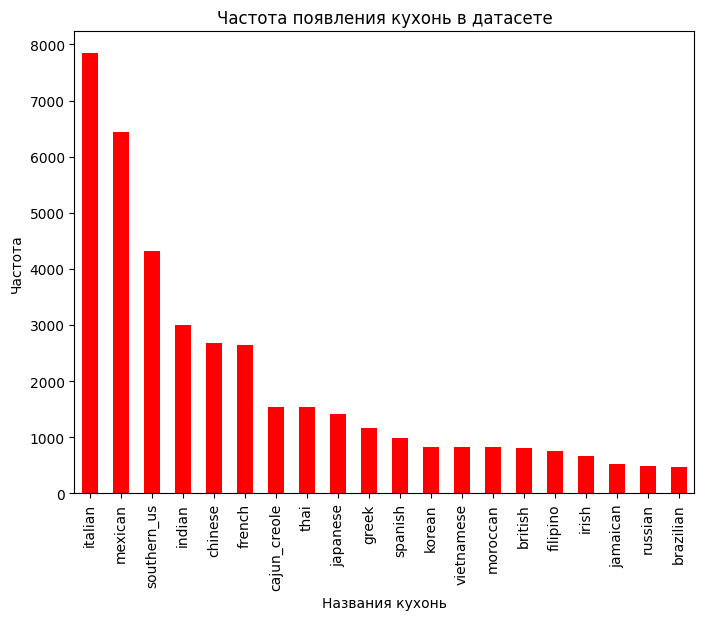

In [ ]:
plt.figure(figsize=(8, 6))
value_counts.plot(kind='bar', color='red')
plt.title('Частота появления кухонь в датасете')
plt.xlabel('Названия кухонь')
plt.ylabel('Частота')
plt.show()

Посмотрим, какие ингридиенты являются самыми популярными для каждой кухни

In [ ]:
dict_of_cuisines = {cuisine_name:dict() for cuisine_name in value_counts.index}

In [ ]:
for i in range(shape[0]):
  current_cuisine = my_json['cuisine'][i]
  current_ingredients = my_json['ingredients'][i]
  for ingredient in current_ingredients:
    if ingredient in dict_of_cuisines[current_cuisine].keys():
      dict_of_cuisines[current_cuisine][ingredient] += 1
    else:
      dict_of_cuisines[current_cuisine][ingredient] = 1


In [ ]:
dict_of_cuisines['italian']

{'sugar': 760,
 'pistachio nuts': 7,
 'white almond bark': 1,
 'flour': 142,
 'vanilla extract': 219,
 'olive oil': 3111,
 'almond extract': 56,
 'eggs': 627,
 'baking powder': 186,
 'dried cranberries': 8,
 'chopped tomatoes': 37,
 'fresh basil': 787,
 'garlic': 1471,
 'extra-virgin olive oil': 1362,
 'kosher salt': 656,
 'flat leaf parsley': 588,
 'pimentos': 16,
 'sweet pepper': 7,
 'dried oregano': 626,
 'sharp cheddar cheese': 9,
 'pepper': 965,
 'swiss cheese': 7,
 'provolone cheese': 138,
 'canola oil': 41,
 'mushrooms': 184,
 'black olives': 67,
 'sausages': 58,
 'Italian parsley leaves': 74,
 'walnuts': 38,
 'hot red pepper flakes': 76,
 'fresh lemon juice': 471,
 'trout fillet': 3,
 'garlic cloves': 1619,
 'chipotle chile': 2,
 'fine sea salt': 77,
 'fresh parmesan cheese': 251,
 'butter': 1030,
 'all-purpose flour': 918,
 'fat free less sodium chicken broth': 158,
 'chopped fresh chives': 68,
 'gruyere cheese': 18,
 'ground black pepper': 1444,
 'bacon slices': 48,
 'gnocchi

In [ ]:
def take_n_most_popular_ingredients(cuisine, n):
  return dict(sorted(cuisine.items(), key=lambda item: item[1], reverse=True)[:n])

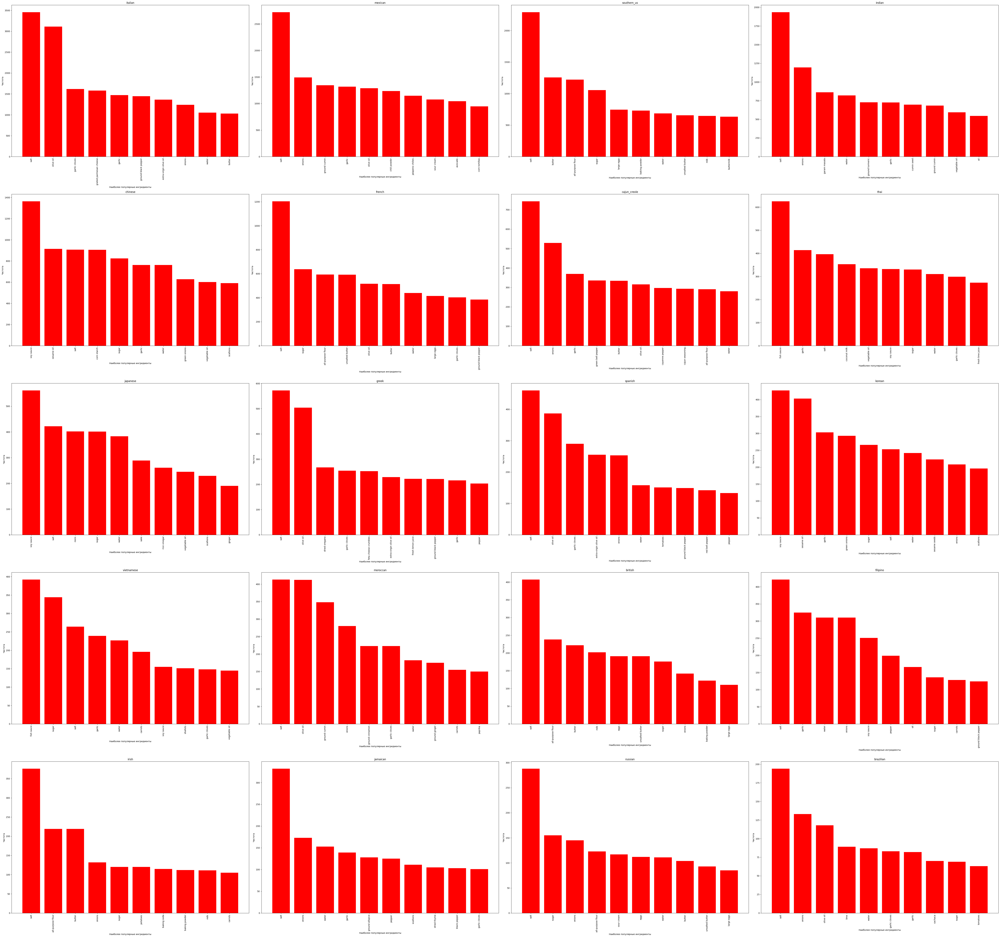

In [ ]:
data = {cuisine:take_n_most_popular_ingredients(dict_of_cuisines[cuisine], 10) for cuisine in dict_of_cuisines}

fig, axs = plt.subplots(5, 4, figsize=(64, 60))

keys = list(data.keys())

for i in range(5):
    for j in range(4):
        if keys:
            key = keys.pop(0)
            value = data[key]
            current_keys = list(value.keys())
            current_values = list(value.values())
            axs[i, j].bar(current_keys, current_values, color='red')
            axs[i, j].set_title(key)
            axs[i, j].set_xlabel('Наиболее популярные ингридиенты')
            axs[i, j].set_ylabel('Частота')
            axs[i, j].tick_params(axis='x', labelrotation=90)


plt.tight_layout()
plt.show()

Попробуем понять, есть ли связь между длиной списка ингридиентов и названием кухни

In [ ]:
cuisines_and_lenghts = {cuisine_name:[] for cuisine_name in value_counts.index}

In [ ]:
cuisines = list(value_counts.index)

In [ ]:
for i in range(shape[0]):
  current_cuisine = my_json['cuisine'][i]
  current_len = len(my_json['ingredients'][i])
  cuisines_and_lenghts[current_cuisine].append(current_len)

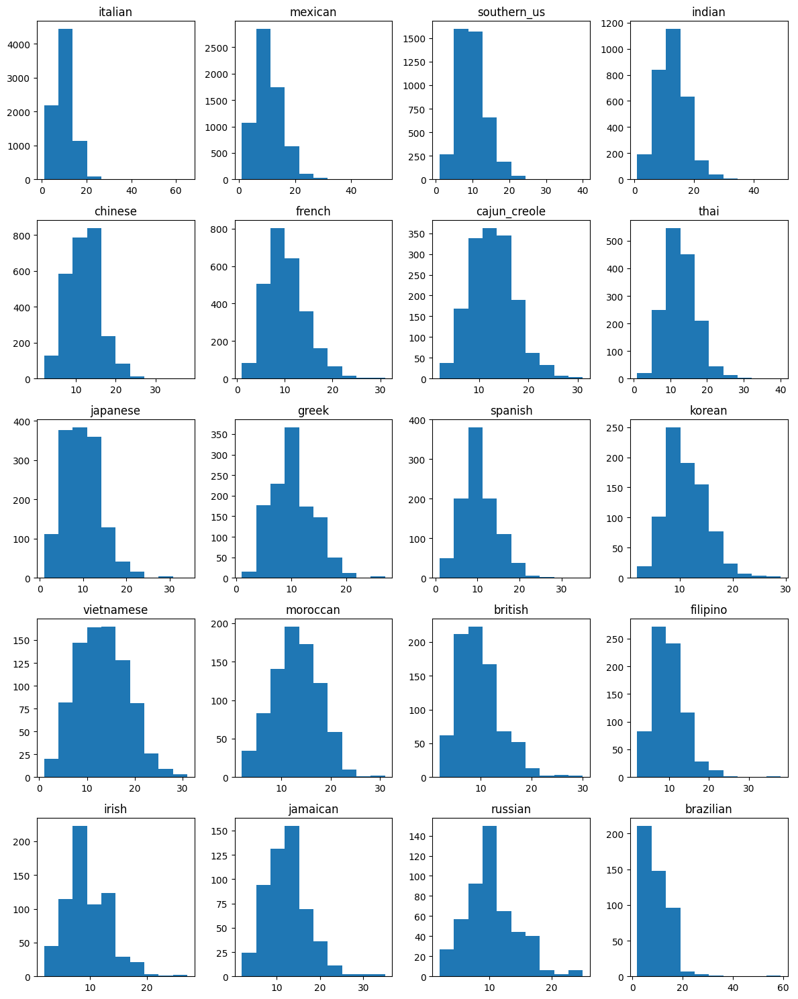

In [ ]:
fig, axs = plt.subplots(5, 4, figsize=(12, 15))
flatten_axs = axs.flatten()

for i in range(20):
    ax = flatten_axs[i]
    current_cuisine = cuisines[i]
    ax.hist(cuisines_and_lenghts[current_cuisine], bins=10)
    ax.set_title(f'{current_cuisine}')

plt.tight_layout()
plt.show()

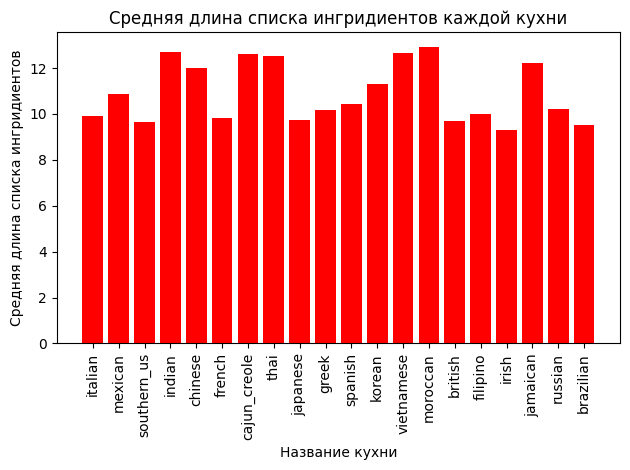

In [ ]:
keys = cuisines
values = [np.mean(cuisines_and_lenghts[cuisine]) for cuisine in cuisines]


plt.bar(keys, values, color='red')


plt.xlabel('Название кухни')
plt.ylabel('Средняя длина списка ингридиентов')
plt.title('Средняя длина списка ингридиентов каждой кухни')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

Как видно, есть кухни, среднее количество ингридиентов в которых 12 и более, а есть и те, которых меньше 10

## Перевод данных в новый формат

Несмотря на проделанный анализ, непонятно, как подступиться к задаче с имеющимися данными

Чтобы прийти к классической задаче машинного обучения, где у каждого объекта одинаковое число признаков, воспользуемся методом One-Hot-Encoding

В данном случае мы соберём датасет, столбцами которого будут ингридиенты и целевая метка(кухня), и для каждого блюда значения в столбцах будут равны 0 или 1 (1, если ингридиент применяется в блюде, и 0, если нет)

Также в качестве фичи добавим длину списка ингридиентов, с которой уже поработали выше

In [ ]:
set_of_ingredients = set()
for i in range(shape[0]):
  set_of_ingredients |= set(my_json['ingredients'][i])

In [ ]:
count_of_ingredients = len(set_of_ingredients)

In [ ]:
list_of_ingredients = list(set_of_ingredients)
data = {name_of_ingredient:[] for name_of_ingredient in (list_of_ingredients + ['length'] + ['cuisine'])}
for i in range(shape[0]):
  for j in list_of_ingredients:
    data[j].append(1 if j in my_json['ingredients'][i] else 0)
  data['length'].append(len(my_json['ingredients'][i]))
  data['cuisine'].append(my_json['cuisine'][i])
  if i % 1000 == 0:
    print(f'{i}/{shape[0]} complited')

0/39774 complited
1000/39774 complited
2000/39774 complited
3000/39774 complited
4000/39774 complited
5000/39774 complited
6000/39774 complited
7000/39774 complited
8000/39774 complited
9000/39774 complited
10000/39774 complited
11000/39774 complited
12000/39774 complited
13000/39774 complited
14000/39774 complited
15000/39774 complited
16000/39774 complited
17000/39774 complited
18000/39774 complited
19000/39774 complited
20000/39774 complited
21000/39774 complited
22000/39774 complited
23000/39774 complited
24000/39774 complited
25000/39774 complited
26000/39774 complited
27000/39774 complited
28000/39774 complited
29000/39774 complited
30000/39774 complited
31000/39774 complited
32000/39774 complited
33000/39774 complited
34000/39774 complited
35000/39774 complited
36000/39774 complited
37000/39774 complited
38000/39774 complited
39000/39774 complited


In [ ]:
df = pd.DataFrame(data)

## Применение модели машинного обучения

И теперь, когда мы привели датасет к удобному виду, можно делать предсказания с помощью модели машинного обучения

Отделим признаки и целевую переменную, после чего разделим данные на обучающую и тестовую выборку в пропорции 7/3

In [ ]:
X = df[list_of_ingredients]
y = df['cuisine']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


Воспользуемся простой, и в то же время достаточно эффективной моделью для решения задачи классификации - логистической регрессией

In [ ]:
logreg = LogisticRegression()

Обучим модель на имеющихся у нас обучающих данных

In [ ]:
logreg.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

Сделаем предсказания модели по тестовым признаковым описаниям объектов

In [ ]:
predictions = logreg.predict(X_test)

Сравним предсказания модели с настоящими метками классов

In [ ]:
accuracy = accuracy_score(y_test, predictions)
print(f"Accuracy: {accuracy:.4f}")

Accuracy: 0.7754


Точность хорошая, но также попробуем более продвинутый метод - градиентный бустинг


In [ ]:
model = CatBoostClassifier(iterations = 50)

Сделаем предсказание

In [ ]:
model.fit(X_train, y_train)
predictions = model.predict(X_test)

Learning rate set to 0.5
0:	learn: 2.3792406	total: 1.47s	remaining: 1m 12s
1:	learn: 2.1450789	total: 2.41s	remaining: 57.7s
2:	learn: 2.0314779	total: 3.34s	remaining: 52.4s
3:	learn: 1.9544291	total: 4.29s	remaining: 49.3s
4:	learn: 1.8842633	total: 5.22s	remaining: 47s
5:	learn: 1.8445211	total: 6.15s	remaining: 45.1s
6:	learn: 1.8082732	total: 7.1s	remaining: 43.6s
7:	learn: 1.7578317	total: 8.05s	remaining: 42.3s
8:	learn: 1.7260853	total: 9.02s	remaining: 41.1s
9:	learn: 1.7883061	total: 9.96s	remaining: 39.8s
10:	learn: 1.7088140	total: 10.9s	remaining: 38.7s
11:	learn: 1.8352258	total: 12.1s	remaining: 38.5s
12:	learn: 1.7110603	total: 13.7s	remaining: 39s
13:	learn: 1.6873277	total: 14.7s	remaining: 37.8s
14:	learn: 1.6779268	total: 15.7s	remaining: 36.5s
15:	learn: 1.6523944	total: 16.6s	remaining: 35.3s
16:	learn: 2.0915612	total: 17.5s	remaining: 34s
17:	learn: 2.7913321	total: 18.5s	remaining: 32.8s
18:	learn: 2.5741690	total: 19.4s	remaining: 31.7s
19:	learn: 2.2241088	t

Посмотрим, насколько хорошо катбуст справился со своей задачей

In [ ]:
accuracy = accuracy_score(y_test, predictions)
print(f"Accuracy: {accuracy:.4f}")

Accuracy: 0.6429


Вопреки ожиданиям, градиентный бустинг показал результат хуже, чем логистическая регрессия

Как видно, точность модели достаточно неплоха, а значит ею смело можно пользоваться, если вы создаёте очередной кулинарный шедевр и хотите узнать, из какой кухни исходит это блюдо, а в гугле вас забанили